In [1]:
using FITSIO
using RecipesBase
using Statistics
using LinearAlgebra
using Pkg
using Plots
include("1.jl")#this contain lightcurve function and readevent data structures further i will paste only readevent code here for analysis rest of lightcurve code can be found in"https://github.com/kashish2210/notebooks/blob/main/readevent%20with%20rough_calibration%20and%20lightcurve%20(1).ipynb" 

precompile_functions (generic function with 1 method)

In [2]:
using Test
using FITSIO
using Logging

"""
Dictionary of simple conversion functions for different missions.

This dictionary provides PI (Pulse Invariant) to energy conversion functions
for various X-ray astronomy missions. Each function takes a PI channel value
and returns the corresponding energy in keV.

Supported missions:
- NuSTAR: Nuclear Spectroscopic Telescope Array
- XMM: X-ray Multi-Mirror Mission  
- NICER: Neutron star Interior Composition Explorer
- IXPE: Imaging X-ray Polarimetry Explorer
- AXAF/Chandra: Advanced X-ray Astrophysics Facility
- XTE/RXTE: Rossi X-ray Timing Explorer
"""
const SIMPLE_CALIBRATION_FUNCS = Dict{String, Function}(
    "nustar" => (pi) -> pi * 0.04 + 1.62,
    "xmm" => (pi) -> pi * 0.001,
    "nicer" => (pi) -> pi * 0.01,
    "ixpe" => (pi) -> pi / 375 * 15,
    "axaf" => (pi) -> (pi - 1) * 14.6e-3,  # Chandra/AXAF
    "chandra" => (pi) -> (pi - 1) * 14.6e-3,  # Explicit chandra entry
    "xte" => (pi) -> pi * 0.025  # RXTE/XTE
)

"""
Abstract type for mission-specific calibration and interpretation.

This serves as the base type for all mission support implementations,
allowing for extensibility and type safety in mission-specific operations.
"""
abstract type AbstractMissionSupport end

"""
    MissionSupport{T} <: AbstractMissionSupport

Structure containing mission-specific calibration and interpretation information.

This structure encapsulates all the necessary information for handling
data from a specific X-ray astronomy mission, including calibration
functions, energy column alternatives, and GTI extension preferences.

# Fields
- `name::String`: Mission name (normalized to lowercase)
- `instrument::Union{String, Nothing}`: Instrument identifier
- `epoch::Union{T, Nothing}`: Observation epoch in MJD (for time-dependent calibrations)
- `calibration_func::Function`: PI to energy conversion function
- `interpretation_func::Union{Function, Nothing}`: Mission-specific FITS interpretation function
- `energy_alternatives::Vector{String}`: Preferred energy column names in order of preference
- `gti_extensions::Vector{String}`: GTI extension names in order of preference

# Type Parameters
- `T`: Type of the epoch parameter (typically Float64)
"""
struct MissionSupport{T} <: AbstractMissionSupport
    name::String
    instrument::Union{String, Nothing}
    epoch::Union{T, Nothing}
    calibration_func::Function
    interpretation_func::Union{Function, Nothing}
    energy_alternatives::Vector{String}
    gti_extensions::Vector{String}
end

"""
    get_mission_support(mission::String, instrument=nothing, epoch=nothing) -> MissionSupport

Create mission support object with mission-specific parameters.

This function creates a MissionSupport object containing all the necessary
information for processing data from a specified X-ray astronomy mission.
It handles mission aliases (e.g., Chandra/AXAF) and provides appropriate
defaults for each mission.

# Arguments
- `mission::String`: Mission name (case-insensitive)
- `instrument::Union{String, Nothing}=nothing`: Instrument identifier
- `epoch::Union{Float64, Nothing}=nothing`: Observation epoch in MJD

# Returns
- `MissionSupport{Float64}`: Mission support object

# Throws
- `ArgumentError`: If mission name is empty

# Examples
```julia
# Basic usage
ms = get_mission_support("nustar")

# With instrument specification
ms = get_mission_support("nustar", "FPM_A")

# With epoch for time-dependent calibrations
ms = get_mission_support("xte", "PCA", 50000.0)
```
"""
function get_mission_support(mission::String, 
                           instrument::Union{String, Nothing}=nothing,
                           epoch::Union{Float64, Nothing}=nothing)
    
    # Check for empty mission string
    if isempty(mission)
        throw(ArgumentError("Mission name cannot be empty"))
    end
    
    mission_lower = lowercase(mission)
    
    # Handle chandra/axaf aliases - normalize to chandra
    if mission_lower in ["chandra", "axaf"]
        mission_lower = "chandra"
    end
    
    calib_func = if haskey(SIMPLE_CALIBRATION_FUNCS, mission_lower)
        SIMPLE_CALIBRATION_FUNCS[mission_lower]
    else
        @warn "Mission $mission not recognized, using identity function"
        identity
    end
    
    # Mission-specific energy alternatives (order matters!)
    energy_alts = if mission_lower in ["chandra", "axaf"]
        ["ENERGY", "PI", "PHA"]  # Chandra usually has ENERGY column
    elseif mission_lower == "xte"
        ["PHA", "PI", "ENERGY"]
    elseif mission_lower == "nustar"
        ["PI", "ENERGY", "PHA"]
    else
        ["ENERGY", "PI", "PHA"]
    end
    
    # Mission-specific GTI extensions
    gti_exts = if mission_lower == "xmm"
        ["GTI", "GTI0", "STDGTI"]
    elseif mission_lower in ["chandra", "axaf"]
        ["GTI", "GTI0", "GTI1", "GTI2", "GTI3"]
    else
        ["GTI", "STDGTI"]
    end
    
    MissionSupport{Float64}(mission_lower, instrument, epoch, calib_func, nothing, energy_alts, gti_exts)
end

"""
    apply_calibration(mission_support::MissionSupport, pi_channels::AbstractArray) -> Vector{Float64}

Apply calibration function to PI channels.

Converts PI (Pulse Invariant) channel values to energies in keV using
the mission-specific calibration function stored in the MissionSupport object.

# Arguments
- `mission_support::MissionSupport`: Mission support object containing calibration function
- `pi_channels::AbstractArray{T}`: Array of PI channel values

# Returns
- `Vector{Float64}`: Array of energy values in keV

# Examples
```julia
ms = get_mission_support("nustar")
pi_values = [100, 500, 1000]
energies = apply_calibration(ms, pi_values)
```
"""
function apply_calibration(mission_support::MissionSupport, pi_channels::AbstractArray{T}) where T
    if isempty(pi_channels)
        return similar(pi_channels, Float64)
    end
    return mission_support.calibration_func.(pi_channels)
end

"""
    patch_mission_info(info::Dict{String,Any}, mission=nothing) -> Dict{String,Any}

Apply mission-specific patches to header information.

This function applies mission-specific modifications to FITS header information
to handle mission-specific quirks and conventions. It's based on the Python
implementation in Stingray's mission interpretation module.

# Arguments
- `info::Dict{String,Any}`: Dictionary containing header information
- `mission::Union{String,Nothing}=nothing`: Mission name

# Returns
- `Dict{String,Any}`: Patched header information dictionary

# Examples
```julia
info = Dict("gti" => "STDGTI", "ecol" => "PHA")
patched = patch_mission_info(info, "xmm")  # Adds GTI0 to gti field
```
"""
function patch_mission_info(info::Dict{String,Any}, mission::Union{String,Nothing}=nothing)
    if isnothing(mission)
        return info
    end
    
    mission_lower = lowercase(mission)
    patched_info = copy(info)
    
    # Normalize chandra/axaf
    if mission_lower in ["chandra", "axaf"]
        mission_lower = "chandra"
    end
    
    if mission_lower == "xmm" && haskey(patched_info, "gti")
        patched_info["gti"] = string(patched_info["gti"], ",GTI0")
    elseif mission_lower == "xte" && haskey(patched_info, "ecol")
        patched_info["ecol"] = "PHA"
        patched_info["ccol"] = "PCUID"
    elseif mission_lower == "chandra"
        # Chandra-specific patches
        if haskey(patched_info, "DETNAM")
            patched_info["detector"] = patched_info["DETNAM"]
        end
        # Add Chandra-specific time reference if needed
        if haskey(patched_info, "TIMESYS")
            patched_info["time_system"] = patched_info["TIMESYS"]
        end
    end
    
    return patched_info
end
function interpret_fits_data!(f::FITS, mission_support::MissionSupport)
    # Placeholder for mission-specific interpretation
    # This would contain mission-specific FITS handling logic
    return nothing
end

interpret_fits_data! (generic function with 1 method)

[ Info: Reading events from HDU 2 with columns: TIME, CCDNR, PHA, PI, PRIOR, KIND
[ Info: Successfully read 1708244 events
[ Info: Using 'PI' column for energy data
[ Info: Applying mission calibration for xmm
[ Info: Energy data: 1708244 values, range: (0.0, 0.341)
[ Info: Successfully loaded 1708244 events from xmm_test.fits


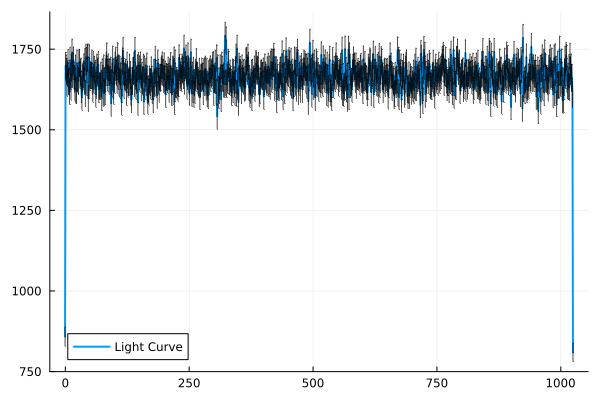

In [9]:
events = readevents("xmm_test.fits", mission="xmm")
plot(events, 1.0, show_gaps=false)

[ Info: Reading events from HDU 2 with columns: TIME, PI
[ Info: Successfully read 1000 events
[ Info: Using 'PI' column for energy data
[ Info: Energy data: 1000 values, range: (1.0, 1022.0)
[ Info: Successfully loaded 1000 events from nomission.evt
[ Info: Event times not sorted - sorting events by time


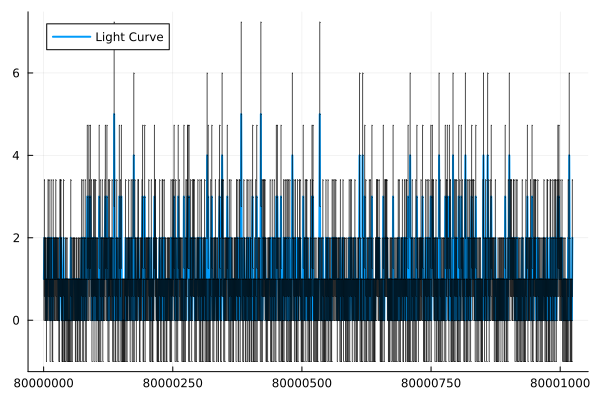

In [10]:
events1 = readevents("nomission.evt")
plot(events1, 1.0, show_gaps=false)

[ Info: Reading events from HDU 2 with columns: TIME, PI, ENERGY
[ Info: Successfully read 1000 events
[ Info: Using 'PI' column for energy data
[ Info: Applying mission calibration for nustar
[ Info: Energy data: 1000 values, range: (1.6600000000000001, 42.5)
[ Info: Successfully loaded 1000 events from monol_testA_calib.evt


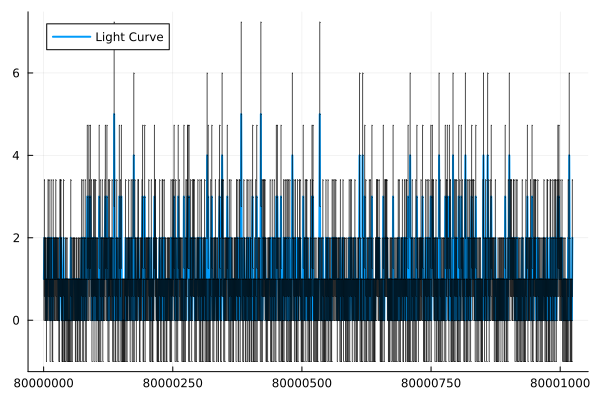

In [11]:
events2 = readevents("monol_testA_calib.evt", mission="nustar")
plot(events2, 1.0, show_gaps=false)

[ Info: Reading events from HDU 2 with columns: TIME, PI
[ Info: Successfully read 1000 events
[ Info: Using 'PI' column for energy data
[ Info: Applying mission calibration for nustar
[ Info: Energy data: 1000 values, range: (1.6600000000000001, 42.5)
[ Info: Successfully loaded 1000 events from monol_testA.evt


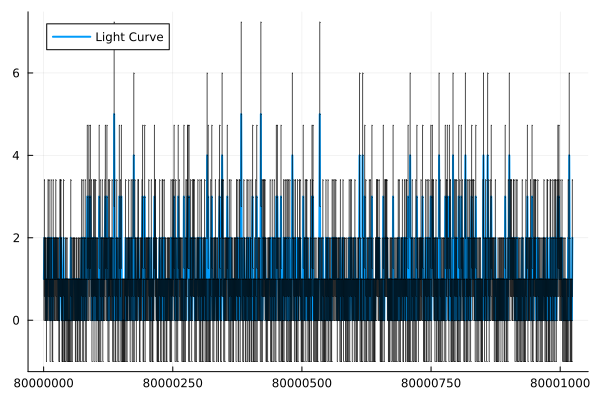

In [12]:
events3 = readevents("monol_testA.evt", mission="nustar")
plot(events3, 1.0, show_gaps=false)

[ Info: Reading events from HDU 2 with columns: TIME, PI, ENERGY
[ Info: Successfully read 1000 events
[ Info: Using 'PI' column for energy data
[ Info: Applying mission calibration for nustar
[ Info: Energy data: 1000 values, range: (1.6600000000000001, 42.5)
[ Info: Successfully loaded 1000 events from monol_testA_calib_unsrt.evt
[ Info: Event times not sorted - sorting events by time


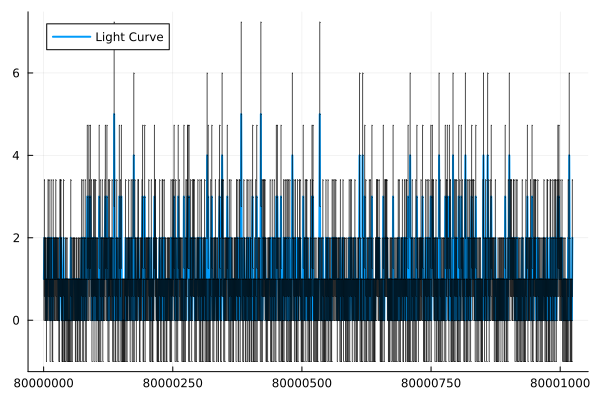

In [13]:
events4 = readevents("monol_testA_calib_unsrt.evt", mission="nustar")
plot(events4, 1.0, show_gaps=false)

In [ ]:
events5 = readevents("lcurve_new.fits", mission="nicer")
plot(events5, 1.0, show_gaps=false)#this is genrating plots but taking to much time and memory same plot like below one with bigger blue line

[ Info: Reading events from HDU 2 with columns: TIME, XAX_E, RATE
[ Info: Successfully read 2000 events
[ Info: No energy column found in available alternatives: ENERGY, PI, PHA
[ Info: Successfully loaded 2000 events from lcurve_new.fits


[ Info: Reading events from HDU 2 with columns: TIME, XAX_E, RATE1, ERROR1, FRACEXP
[ Info: Successfully read 1026 events
[ Info: No energy column found in available alternatives: ENERGY, PI, PHA
[ Info: Successfully loaded 1026 events from lcurveA.fits


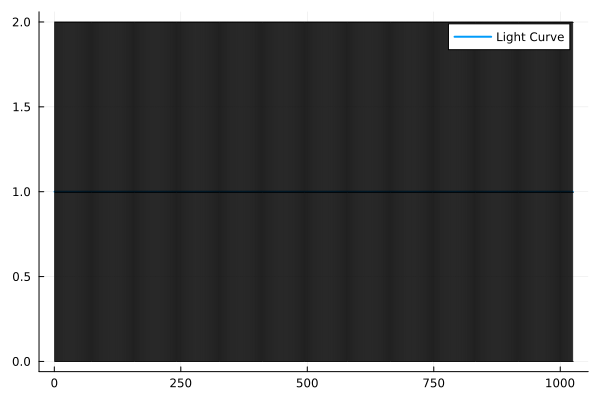

In [3]:
events6 = readevents("lcurveA.fits", mission="nicer")
plot(events6, 1.0, show_gaps=false)

[ Info: Reading events from HDU 2 with columns: time, ccd_id, x, y, pha, energy, pi, grade
[ Info: Successfully read 4612 events
[ Info: Using 'energy' column for energy data
[ Info: Applying mission calibration for axaf
[ Info: Energy data: 4612 values, range: (2.4244345275878905, 261.968341796875)
[ Info: Successfully loaded 4612 events from chandra_test.fits


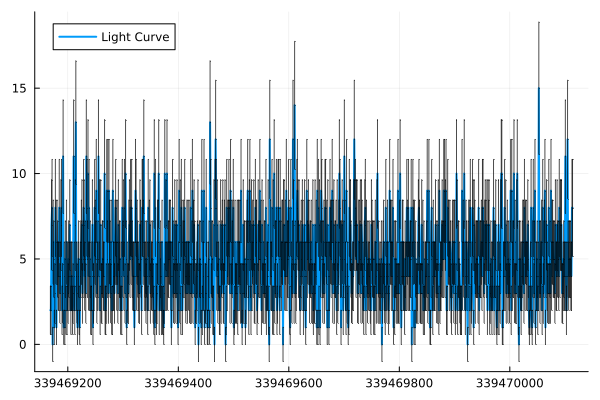

In [5]:
events10 = readevents("chandra_test.fits", mission="axaf")
plot(events10, 1.0, show_gaps=false)

[ Info: Reading events from HDU 2 with columns: time, ccd_id, x, y, pi, grade
[ Info: Successfully read 4612 events
[ Info: Using 'pi' column for energy data
[ Info: Applying mission calibration for axaf
[ Info: Energy data: 4612 values, range: (0.1606, 14.9358)
[ Info: Successfully loaded 4612 events from chandra_noener_test.fits


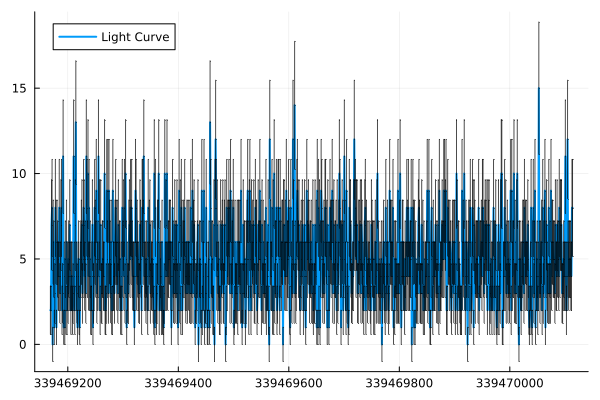

In [6]:
events10a = readevents("chandra_noener_test.fits", mission="axaf")
plot(events10a, 1.0, show_gaps=false)

[ Info: Reading events from HDU 2 with columns: TIME, Event, PCUID, ANODEID, PHA
[ Info: Successfully read 3518 events
[ Info: Using 'PHA' column for energy data
[ Info: Energy data: 3518 values, range: (2.0, 255.0)
[ Info: Successfully loaded 3518 events from xte_gx_test.evt.gz


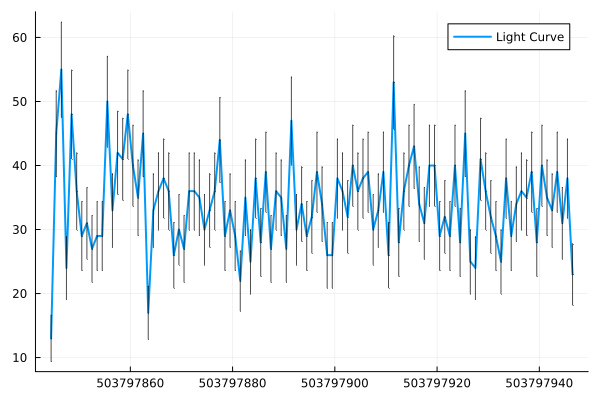

In [7]:
events12 = readevents("xte_gx_test.evt.gz")
plot(events12, 1.0, show_gaps=false)

In [9]:
"""
    create_synthetic_events(n_events::Int=1000; mission::String="nustar", 
                           time_range::Tuple{Float64,Float64}=(0.0, 1000.0),
                           pi_range::Tuple{Int,Int}=(1, 4096),
                           T::Type=Float64) -> EventList{T}

Create synthetic X-ray event data for testing purposes.

This function generates realistic synthetic X-ray event data with proper time ordering,
energy calibration, and mission-specific metadata. The generated events include:
- Random event times within the specified range
- Random PI (Pulse Invariant) channels
- Energy values calculated using mission-specific calibration
- Detector ID assignments
- Realistic FITS-style metadata headers

# Arguments
- `n_events::Int=1000`: Number of events to generate
- `mission::String="nustar"`: Mission name for calibration and metadata
- `time_range::Tuple{Float64,Float64}=(0.0, 1000.0)`: Time range for events (start, stop)
- `pi_range::Tuple{Int,Int}=(1, 4096)`: PI channel range
- `T::Type=Float64`: Numeric type for the data

# Returns
- `EventList{T}`: Synthetic event list with times, energies, and metadata

# Examples
```julia
# Default NuSTAR events
events = create_synthetic_events()

# Custom XMM events
events = create_synthetic_events(5000; mission="xmm", time_range=(100.0, 200.0))

# NICER events with custom PI range
events = create_synthetic_events(2000; mission="nicer", pi_range=(50, 1000))
```
"""
function create_synthetic_events(n_events::Int=1000; 
                               mission::String="nustar",
                               time_range::Tuple{Float64,Float64}=(0.0, 1000.0),
                               pi_range::Tuple{Int,Int}=(1, 4096),
                               T::Type=Float64)
    
    # Input validation
    if n_events <= 0
        throw(ArgumentError("Number of events must be positive"))
    end
    
    if time_range[1] >= time_range[2]
        throw(ArgumentError("Time range start must be less than end"))
    end
    
    if pi_range[1] > pi_range[2]
        throw(ArgumentError("PI range start must be less than or equal to end"))
    end
    
    # Get mission support for calibration
    mission_support = get_mission_support(mission)
    
    # Generate random event times and sort them
    times = sort(rand(n_events) * (time_range[2] - time_range[1]) .+ time_range[1])
    times = convert(Vector{T}, times)
    
    # Generate random PI channels
    pi_channels = rand(pi_range[1]:pi_range[2], n_events)
    
    # Apply mission-specific calibration to get energies
    energies = convert(Vector{T}, apply_calibration(mission_support, pi_channels))
    
    # Generate detector IDs (assume 4-detector system like NuSTAR)
    detector_ids = rand(0:3, n_events)
    
    # Create extra columns dictionary
    extra_columns = Dict{String, Vector}(
        "PI" => pi_channels,
        "DETID" => detector_ids
    )
    
    # Create synthetic filename
    filename = "synthetic_$(mission).fits"
    
    # Create metadata headers
    main_header = Dict{String, Any}(
        "TELESCOP" => uppercase(mission),
        "INSTRUME" => "TEST_INSTRUMENT",
        "OBSERVER" => "SYNTHETIC_DATA",
        "OBJECT" => "TEST_SOURCE",
        "RA_NOM" => 180.0,
        "DEC_NOM" => 0.0,
        "EQUINOX" => 2000.0,
        "RADECSYS" => "FK5",
        "TSTART" => time_range[1],
        "TSTOP" => time_range[2],
        "EXPOSURE" => time_range[2] - time_range[1],
        "ONTIME" => time_range[2] - time_range[1],
        "LIVETIME" => time_range[2] - time_range[1],
        "NAXIS2" => n_events,
        "TIMESYS" => "TT",
        "TIMEREF" => "LOCAL",
        "TIMEUNIT" => "s",
        "MJDREFI" => 55197,  # Standard MJD reference for many missions
        "MJDREFF" => 0.00076601852,
        "CLOCKCORR" => "T",
        "DATE-OBS" => "2020-01-01T00:00:00",
        "DATE-END" => "2020-01-01T01:00:00"
    )
    
    # Add mission-specific header information
    if lowercase(mission) == "nustar"
        main_header["DETNAM"] = "TEST_DET"
        main_header["PIFLTCOR"] = "T"
    elseif lowercase(mission) == "xmm"
        main_header["FILTER"] = "Medium"
        main_header["SUBMODE"] = "PrimeFullWindow"
    elseif lowercase(mission) == "nicer"
        main_header["DETNAM"] = "TEST_NICER"
        main_header["FILTFILE"] = "NONE"
    elseif lowercase(mission) in ["chandra", "axaf"]
        main_header["DETNAM"] = "ACIS-S"
        main_header["GRATING"] = "NONE"
    elseif lowercase(mission) == "xte"
        main_header["DETNAM"] = "PCA"
        main_header["LAYERS"] = "ALL"
    elseif lowercase(mission) == "ixpe"
        main_header["DETNAM"] = "GPD"
        main_header["POLMODE"] = "ON"
    end
    
    # Create additional headers (empty for now, but maintaining structure)
    headers = [main_header]
    
    # Create DictMetadata object
    metadata = DictMetadata(headers)
    
    # Create and return EventList
    return EventList{T}(filename, times, energies, extra_columns, metadata)
end

@testset verbose=true "Synthetic Events Tests" begin
    
    @testset "Basic Synthetic Event Creation" begin
        @testset "Default Parameters" begin
            events = create_synthetic_events()
            
            # Test basic structure
            @test isa(events, EventList)
            @test length(events.times) == 1000  # Default n_events
            @test length(events.energies) == 1000
            @test events.filename == "synthetic_nustar.fits"
            
            # Test times are sorted and in range
            @test issorted(events.times)
            @test all(0.0 .<= events.times .<= 1000.0)
            
            # Test energies are positive (after calibration)
            @test all(events.energies .> 0)
            
            # Test extra columns
            @test haskey(events.extra_columns, "PI")
            @test haskey(events.extra_columns, "DETID")
            @test length(events.extra_columns["PI"]) == 1000
            @test length(events.extra_columns["DETID"]) == 1000
            
            # Test PI channels are in expected range
            @test all(1 .<= events.extra_columns["PI"] .<= 4096)
            
            # Test detector IDs are in expected range
            @test all(0 .<= events.extra_columns["DETID"] .<= 3)
            
            # Test metadata structure
            @test isa(events.metadata, DictMetadata)
            @test length(events.metadata.headers) >= 1
            
            # Test metadata content (assuming first header contains main info)
            main_header = events.metadata.headers[1]
            @test main_header["TELESCOP"] == "NUSTAR"
            @test main_header["INSTRUME"] == "TEST_INSTRUMENT"
            @test main_header["NAXIS2"] == 1000
            @test main_header["TSTART"] == 0.0
            @test main_header["TSTOP"] == 1000.0
        end
        
        @testset "Custom Parameters" begin
            n_events = 500
            mission = "xmm"
            time_range = (100.0, 200.0)
            pi_range = (50, 1000)
            
            events = create_synthetic_events(n_events; 
                                           mission=mission, 
                                           time_range=time_range, 
                                           pi_range=pi_range)
            
            # Test custom parameters are respected
            @test length(events.times) == n_events
            @test length(events.energies) == n_events
            @test events.filename == "synthetic_xmm.fits"
            
            # Test time range
            @test all(time_range[1] .<= events.times .<= time_range[2])
            main_header = events.metadata.headers[1]
            @test main_header["TSTART"] == time_range[1]
            @test main_header["TSTOP"] == time_range[2]
            
            # Test PI range
            @test all(pi_range[1] .<= events.extra_columns["PI"] .<= pi_range[2])
            
            # Test mission-specific metadata
            @test main_header["TELESCOP"] == "XMM"
        end
        
        @testset "Different Missions" begin
            missions = ["nustar", "xmm", "nicer", "ixpe", "axaf", "chandra", "xte"]
            
            for mission in missions
                events = create_synthetic_events(100; mission=mission)
                
                @test events.filename == "synthetic_$(mission).fits"
                main_header = events.metadata.headers[1]
                @test main_header["TELESCOP"] == uppercase(mission)
                @test length(events.times) == 100
                @test length(events.energies) == 100
                
                # Test that calibration was applied correctly
                ms = get_mission_support(mission)
                expected_energies = apply_calibration(ms, events.extra_columns["PI"])
                @test events.energies ≈ expected_energies
            end
        end
    end
    
    @testset "Data Quality and Consistency" begin
        @testset "Time Ordering" begin
            for _ in 1:10  # Test multiple times due to randomness
                events = create_synthetic_events(100)
                @test issorted(events.times)
                
                # Test no duplicate times (very unlikely but possible)
                @test length(unique(events.times)) >= 95  # Allow some duplicates due to floating point
            end
        end
        
        @testset "Energy Calibration Consistency" begin
            missions = ["nustar", "xmm", "nicer", "ixpe"]
            
            for mission in missions
                events = create_synthetic_events(200; mission=mission)
                
                # Manually verify calibration
                ms = get_mission_support(mission)
                expected_energies = apply_calibration(ms, events.extra_columns["PI"])
                @test events.energies ≈ expected_energies
                
                # Test energy ranges are reasonable for each mission
                if mission == "nustar"
                    # NuSTAR: pi * 0.04 + 1.62, PI range 1-4096
                    @test minimum(events.energies) >= 1.66  # 1*0.04 + 1.62
                    @test maximum(events.energies) <= 165.46  # 4096*0.04 + 1.62
                elseif mission == "xmm"
                    # XMM: pi * 0.001, PI range 1-4096
                    @test minimum(events.energies) >= 0.001
                    @test maximum(events.energies) <= 4.096
                elseif mission == "nicer"
                    # NICER: pi * 0.01, PI range 1-4096
                    @test minimum(events.energies) >= 0.01
                    @test maximum(events.energies) <= 40.96
                elseif mission == "ixpe"
                    # IXPE: pi / 375 * 15, PI range 1-4096
                    @test minimum(events.energies) >= 15.0/375  # ≈ 0.04
                    @test maximum(events.energies) <= 4096*15.0/375  # ≈ 163.84
                end
            end
        end
        
        @testset "Statistical Properties" begin
            events = create_synthetic_events(10000)  # Large sample for statistics
            
            # Test time distribution (should be roughly uniform)
            time_hist = fit(Histogram, events.times, 0:100:1000)
            counts = time_hist.weights
            # Expect roughly equal counts in each bin (within statistical fluctuation)
            expected_count = 10000 / 10  # 10 bins
            @test all(abs.(counts .- expected_count) .< 3 * sqrt(expected_count))  # 3-sigma test
            
            # Test PI distribution (should be roughly uniform over discrete range)
            pi_hist = fit(Histogram, events.extra_columns["PI"], 1:100:4096)
            pi_counts = pi_hist.weights
            # More lenient test due to discrete uniform distribution
            @test std(pi_counts) / mean(pi_counts) < 0.2  # Coefficient of variation < 20%
            
            # Test detector ID distribution
            detid_counts = [count(==(i), events.extra_columns["DETID"]) for i in 0:3]
            @test all(abs.(detid_counts .- 2500) .< 3 * sqrt(2500))  # Each detector ~2500 events
        end
    end
    
    @testset "Edge Cases and Error Handling" begin
        @testset "Small Event Counts" begin
            for n in [1, 2, 5, 10]
                events = create_synthetic_events(n)
                @test length(events.times) == n
                @test length(events.energies) == n
                @test length(events.extra_columns["PI"]) == n
                @test length(events.extra_columns["DETID"]) == n
                @test issorted(events.times)
            end
        end
        
        @testset "Large Event Counts" begin
            events = create_synthetic_events(100000)
            @test length(events.times) == 100000
            @test length(events.energies) == 100000
            @test issorted(events.times)
            main_header = events.metadata.headers[1]
            @test main_header["NAXIS2"] == 100000
        end
        
        @testset "Extreme Time Ranges" begin
            # Very short time range
            events = create_synthetic_events(100; time_range=(0.0, 0.1))
            @test all(0.0 .<= events.times .<= 0.1)
            main_header = events.metadata.headers[1]
            @test main_header["TSTART"] == 0.0
            @test main_header["TSTOP"] == 0.1
            
            # Very long time range
            events = create_synthetic_events(100; time_range=(0.0, 1e6))
            @test all(0.0 .<= events.times .<= 1e6)
            main_header = events.metadata.headers[1]
            @test main_header["TSTART"] == 0.0
            @test main_header["TSTOP"] == 1e6
            
            # Negative time range
            events = create_synthetic_events(100; time_range=(-1000.0, -500.0))
            @test all(-1000.0 .<= events.times .<= -500.0)
            @test issorted(events.times)
        end
        
        @testset "Extreme PI Ranges" begin
            # Small PI range
            events = create_synthetic_events(100; pi_range=(100, 110))
            @test all(100 .<= events.extra_columns["PI"] .<= 110)
            
            # Single PI value
            events = create_synthetic_events(100; pi_range=(500, 500))
            @test all(events.extra_columns["PI"] .== 500)
            @test all(events.energies .== events.energies[1])  # All same energy
            
            # Large PI range
            events = create_synthetic_events(100; pi_range=(1, 10000))
            @test all(1 .<= events.extra_columns["PI"] .<= 10000)
        end
        
        @testset "Unknown Mission" begin
            # Should still work but with warning
            @test_logs (:warn, r"Mission unknown_mission not recognized") begin
                events = create_synthetic_events(100; mission="unknown_mission")
                @test events.filename == "synthetic_unknown_mission.fits"
                main_header = events.metadata.headers[1]
                @test main_header["TELESCOP"] == "UNKNOWN_MISSION"
                @test length(events.times) == 100
                # Should use identity calibration
                @test events.energies == Float64.(events.extra_columns["PI"])
            end
        end
    end
    
    @testset "Data Integrity" begin
        @testset "No Missing Data" begin
            events = create_synthetic_events(1000)
            
            # Check no NaN or missing values
            @test all(isfinite.(events.times))
            @test all(isfinite.(events.energies))
            @test all(isfinite.(events.extra_columns["PI"]))
            @test all(isfinite.(events.extra_columns["DETID"]))
            
            # Check no negative energies (after calibration)
            @test all(events.energies .>= 0)
        end
        
        @testset "Correct Data Types" begin
            events = create_synthetic_events(100)
            
            @test eltype(events.times) == Float64
            @test eltype(events.energies) == Float64
            @test eltype(events.extra_columns["PI"]) <: Integer
            @test eltype(events.extra_columns["DETID"]) <: Integer
            @test isa(events.metadata, DictMetadata)
            @test isa(events.filename, String)
        end
        
        @testset "Array Length Consistency" begin
            for n in [10, 100, 1000, 5000]
                events = create_synthetic_events(n)
                
                @test length(events.times) == n
                @test length(events.energies) == n
                @test length(events.extra_columns["PI"]) == n
                @test length(events.extra_columns["DETID"]) == n
                main_header = events.metadata.headers[1]
                @test main_header["NAXIS2"] == n
            end
        end
    end
    
    @testset "Mission-Specific Behavior" begin
        @testset "Mission Name Handling" begin
            # Test case sensitivity
            missions = ["NUSTAR", "nustar", "NuSTAR", "NuStar"]
            for mission in missions
                events = create_synthetic_events(100; mission=mission)
                main_header = events.metadata.headers[1]
                @test main_header["TELESCOP"] == "NUSTAR"
                @test events.filename == "synthetic_$(mission).fits"
            end
        end
        
        @testset "Calibration Differences" begin
            # Same PI values should give different energies for different missions
            test_pi_range = (1000, 1000)  # Fixed PI value
            
            results = Dict{String, Float64}()
            for mission in ["nustar", "xmm", "nicer", "ixpe"]
                events = create_synthetic_events(100; mission=mission, pi_range=test_pi_range)
                results[mission] = events.energies[1]  # All should be same since PI is fixed
            end
            
            # Different missions should give different energies
            missions = collect(keys(results))
            for i in 1:length(missions)
                for j in (i+1):length(missions)
                    @test results[missions[i]] ≠ results[missions[j]]
                end
            end
        end
        
        @testset "Metadata Consistency" begin
            missions = ["nustar", "xmm", "nicer", "ixpe", "axaf", "chandra"]
            
            for mission in missions
                events = create_synthetic_events(100; mission=mission)
                
                @test events.metadata.headers[1]["TELESCOP"] == uppercase(mission)
                @test events.metadata.headers[1]["INSTRUME"] == "TEST_INSTRUMENT"
                @test haskey(events.metadata.headers[1], "NAXIS2")
                @test haskey(events.metadata.headers[1], "TSTART")
                @test haskey(events.metadata.headers[1], "TSTOP")
            end
        end
    end
    
    @testset "Performance and Memory" begin
        @testset "Large Dataset Creation" begin
            # Test that large datasets can be created without issues
            @time events = create_synthetic_events(50000)
            @test length(events.times) == 50000
            @test sizeof(events.times) + sizeof(events.energies) < 1e6  # Less than 1MB for 50k events
        end
        
        @testset "Memory Efficiency" begin
            # Test that no unnecessary copies are made
            events1 = create_synthetic_events(1000)
            events2 = create_synthetic_events(1000)
            
            # Each should have independent data
            @test events1.times !== events2.times
            @test events1.energies !== events2.energies
            @test events1.extra_columns["PI"] !== events2.extra_columns["PI"]
        end
    end
    
    @testset "Reproducibility" begin
        @testset "Random Seed Behavior" begin
            # Test that different calls produce different results (random behavior)
            events1 = create_synthetic_events(1000)
            events2 = create_synthetic_events(1000)
            
            # Should be different due to randomness
            @test events1.times != events2.times
            @test events1.extra_columns["PI"] != events2.extra_columns["PI"]
            @test events1.extra_columns["DETID"] != events2.extra_columns["DETID"]
            
            # But same structure
            @test length(events1.times) == length(events2.times)
            @test typeof(events1) == typeof(events2)
        end
    end
end

  0.007386 seconds (122 allocations: 3.065 MiB)
Test Summary:                    | Pass  Total  Time
Synthetic Events Tests           |  224    224  7.4s
  Basic Synthetic Event Creation |   63     63  4.6s
  Data Quality and Consistency   |   35     35  1.1s
  Edge Cases and Error Handling  |   41     41  1.2s
  Data Integrity                 |   31     31  0.3s
  Mission-Specific Behavior      |   44     44  0.2s
  Performance and Memory         |    5      5  0.1s
  Reproducibility                |    5      5  0.0s


Test.DefaultTestSet("Synthetic Events Tests", Any[Test.DefaultTestSet("Basic Synthetic Event Creation", Any[Test.DefaultTestSet("Default Parameters", Any[], 20, false, false, true, 1.748887586388e9, 1.748887589699e9, false, "In[9]"), Test.DefaultTestSet("Custom Parameters", Any[], 8, false, false, true, 1.748887589699e9, 1.748887589889e9, false, "In[9]"), Test.DefaultTestSet("Different Missions", Any[], 35, false, false, true, 1.748887589889e9, 1.748887590948e9, false, "In[9]")], 0, false, false, true, 1.748887586388e9, 1.748887590948e9, false, "In[9]"), Test.DefaultTestSet("Data Quality and Consistency", Any[Test.DefaultTestSet("Time Ordering", Any[], 20, false, false, true, 1.748887590948e9, 1.748887590971e9, false, "In[9]"), Test.DefaultTestSet("Energy Calibration Consistency", Any[], 12, false, false, true, 1.748887590971e9, 1.748887590971e9, false, "In[9]"), Test.DefaultTestSet("Statistical Properties", Any[], 3, false, false, true, 1.748887590971e9, 1.748887592029e9, false, "In[9

In [ ]:
"""
Test calibration function for a specific mission
"""
function test_calibration_function(mission::String, pi_values::Vector{<:Number})
    @info "Testing calibration for mission: $mission"
    
    mission_support = get_mission_support(mission)
    
    @info "Input PI values: $(pi_values[1:min(5, length(pi_values))])$(length(pi_values) > 5 ? "..." : "")"
    
    calibrated_energies = apply_calibration(mission_support, pi_values)
    
    @info "Calibrated energies: $(calibrated_energies[1:min(5, length(calibrated_energies))])$(length(calibrated_energies) > 5 ? "..." : "")"
    @info "Energy range: $(minimum(calibrated_energies)) - $(maximum(calibrated_energies)) keV"
    
    return calibrated_energies
end

"""
Test EventList creation and properties safely
"""
function test_eventlist_properties(events)
    properties = String[]
    
    # Test times
    if isdefined(events, :times) && !isnothing(events.times)
        push!(properties, "$(length(events.times)) time values")
    end
    
    # Test energies
    if isdefined(events, :energies) && !isnothing(events.energies)
        push!(properties, "$(length(events.energies)) energy values")
        energy_range = "Energy range: $(round(minimum(events.energies), digits=3)) - $(round(maximum(events.energies), digits=3)) keV"
        push!(properties, energy_range)
    end
    
    # Test extra_columns (not extra_data)
    if isdefined(events, :extra_columns) && !isnothing(events.extra_columns)
        column_names = collect(keys(events.extra_columns))
        push!(properties, "$(length(column_names)) extra columns: $(join(column_names, ", "))")
    end
    
    # Test metadata
    if isdefined(events, :metadata) && !isnothing(events.metadata)
        try
            telescop = haskey(events.metadata, "TELESCOP") ? events.metadata["TELESCOP"] : "unknown"
            push!(properties, "Mission: $telescop")
        catch e
            push!(properties, "Metadata available but unreadable")
        end
    end
    
    # Test filename
    if isdefined(events, :filename) && !isnothing(events.filename)
        push!(properties, "Filename: $(events.filename)")
    end
    
    return properties
end

"""
Test suite for mission support functionality with safe logging
"""
function test_mission_support()
    @info "="^50
    @info "TESTING MISSION SUPPORT SYSTEM"
    @info "="^50
    
    # Test 1: Individual calibration functions
    @info "\n1. Testing individual calibration functions:"
    test_pi_values = [100, 500, 1000, 2000, 4000]
    
    successful_missions = String[]
    failed_missions = String[]
    
    for mission in ["nustar", "xmm", "nicer", "ixpe", "axaf"]
        try
            energies = test_calibration_function(mission, test_pi_values)
            push!(successful_missions, mission)
            @info "✓ $mission calibration successful"
        catch e
            push!(failed_missions, mission)
            @error "✗ $mission calibration failed: $e"
        end
    end
    
    @info "Calibration Summary: $(length(successful_missions)) successful, $(length(failed_missions)) failed"
    
    # Test 2: Synthetic event creation and processing
    @info "\n2. Testing synthetic event creation:"
    
    synthetic_results = Dict{String, Any}()
    
    for mission in ["nustar", "xmm", "axaf"]
        try
            @info "\n--- Testing $mission ---"
            
            # Create synthetic events
            events = create_synthetic_events(500; mission=mission)
            
            # Get properties safely
            properties = test_eventlist_properties(events)
            
            @info "Created EventList with:"
            for prop in properties
                @info "  - $prop"
            end
            
            synthetic_results[mission] = "success"
            @info "✓ $mission synthetic data test successful"
            
        catch e
            synthetic_results[mission] = "failed: $e"
            @error "✗ $mission synthetic data test failed: $e"
        end
    end
    
    # Test 3: Mission support object creation
    @info "\n3. Testing mission support object creation:"
    
    mission_support_results = Dict{String, Any}()
    
    for mission in ["nustar", "xmm", "axaf", "unknown_mission"]
        try
            ms = get_mission_support(mission)
            energy_alts = join(ms.energy_alternatives[1:min(3, length(ms.energy_alternatives))], ", ")
            gti_exts = join(ms.gti_extensions[1:min(3, length(ms.gti_extensions))], ", ")
            
            mission_support_results[mission] = "success"
            @info "✓ Mission support for $mission:"
            @info "  - Energy alternatives: $energy_alts$(length(ms.energy_alternatives) > 3 ? "..." : "")"
            @info "  - GTI extensions: $gti_exts$(length(ms.gti_extensions) > 3 ? "..." : "")"
            
        catch e
            mission_support_results[mission] = "failed: $e"
            @info "⚠ Mission support for $mission: using defaults due to $e"
        end
    end
    
    # Test 4: Cross-mission calibration comparison
    @info "\n4. Testing cross-mission calibration comparison:"
    
    comparison_pi = 1000
    calibration_results = Dict{String, Float64}()
    
    for mission in ["nustar", "xmm", "nicer", "ixpe"]
        try
            ms = get_mission_support(mission)
            energy = apply_calibration(ms, [comparison_pi])[1]
            calibration_results[mission] = energy
            @info "  $mission: PI=$comparison_pi → $(round(energy, digits=3)) keV"
        catch e
            @warn "Could not test calibration for $mission: $e"
        end
    end
    
    # Test 5: Info patching functionality
    @info "\n5. Testing mission info patching:"
    
    test_infos = Dict(
        "xmm" => Dict("gti" => "STDGTI", "ecol" => "PHA"),
        "xte" => Dict("ecol" => "ENERGY", "other" => "value"),
        "chandra" => Dict("DETNAM" => "ACIS-S", "other" => "value")
    )
    
    for (mission, test_info) in test_infos
        try
            original_keys = length(keys(test_info))
            patched_info = patch_mission_info(test_info, mission)
            patched_keys = length(keys(patched_info))
            
            @info "  $mission patching: $original_keys → $patched_keys keys"
            
            # Show key changes
            for (key, value) in patched_info
                if !haskey(test_info, key) || test_info[key] != value
                    @info "    Added/Modified: $key = $value"
                end
            end
            
        catch e
            @warn "Info patching failed for $mission: $e"
        end
    end
    
    # Final Summary
    @info "\n" * "="^50
    @info "TESTING SUMMARY"
    @info "="^50
    
    @info "1. Calibration Functions:"
    @info "   ✓ Successful: $(join(successful_missions, ", "))"
    if !isempty(failed_missions)
        @info "   ✗ Failed: $(join(failed_missions, ", "))"
    end
    
    @info "2. Synthetic Events:"
    for (mission, result) in synthetic_results
        status = result == "success" ? "✓" : "✗"
        @info "   $status $mission: $result"
    end
    
    @info "3. Mission Support Objects:"
    for (mission, result) in mission_support_results
        status = result == "success" ? "✓" : "✗"
        @info "   $status $mission: $result"
    end
    
    @info "4. Calibration Comparison (PI=1000):"
    for (mission, energy) in sort(collect(calibration_results), by=x->x[2])
        @info "   $mission: $(round(energy, digits=3)) keV"
    end
    
    @info "\n" * "="^50
    @info "TESTING COMPLETE"
    @info "="^50
    
    return Dict(
        "calibration" => Dict("successful" => successful_missions, "failed" => failed_missions),
        "synthetic" => synthetic_results,
        "mission_support" => mission_support_results,
        "calibration_comparison" => calibration_results
    )
end

test_mission_support()

[ Info: ==================================================
[ Info: TESTING MISSION SUPPORT SYSTEM
[ Info: ==================================================
┌ Info: 
└ 1. Testing individual calibration functions:
[ Info: Testing calibration for mission: nustar
[ Info: Input PI values: [100, 500, 1000, 2000, 4000]
[ Info: Calibrated energies: [5.62, 21.62, 41.62, 81.62, 161.62]
[ Info: Energy range: 5.62 - 161.62 keV
[ Info: ✓ nustar calibration successful
[ Info: Testing calibration for mission: xmm
[ Info: Input PI values: [100, 500, 1000, 2000, 4000]
[ Info: Calibrated energies: [0.1, 0.5, 1.0, 2.0, 4.0]
[ Info: Energy range: 0.1 - 4.0 keV
[ Info: ✓ xmm calibration successful
[ Info: Testing calibration for mission: nicer
[ Info: Input PI values: [100, 500, 1000, 2000, 4000]
[ Info: Calibrated energies: [1.0, 5.0, 10.0, 20.0, 40.0]
[ Info: Energy range: 1.0 - 40.0 keV
[ Info: ✓ nicer calibration successful
[ Info: Testing calibration for mission: ixpe
[ Info: Input PI values: [100, 5